# Clog Loss: Advance Alzheimer’s Research with Stall Catchers

https://www.drivendata.org/competitions/65/clog-loss-alzheimers-research/page/217/

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
from IPython.display import clear_output
import numpy as np
import pandas as pd
import cv2 
from sklearn.model_selection import train_test_split
from sklearn.metrics import matthews_corrcoef

from IPython.lib.display import YouTubeVideo

import tensorflow as tf
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (15, 10)

from clog_utils import *

AUTOTUNE = tf.data.experimental.AUTOTUNE

np.set_printoptions(precision=3, suppress=True)

tf.__version__

'2.2.0'

### Constants

In [2]:
DATASET_PATH = '/home/user/percepto/datasets/ClogLoss'

### Train Data

In [3]:
train_labels_df = pd.read_csv(f'{DATASET_PATH}/train_labels.csv')
train_labels_df

,filename,stalled
0,100000.mp4,0
1,100001.mp4,0
2,100002.mp4,0
3,100003.mp4,0
4,100004.mp4,0
...,...,...
573043,687207.mp4,0
573044,687208.mp4,0
573045,687209.mp4,0
573046,687210.mp4,0


In [4]:
train_stalled_df = train_labels_df[train_labels_df['stalled'] > 0]
train_stalled_df

,filename,stalled
107,100109.mp4,1
280,100289.mp4,1
1270,101309.mp4,1
1595,101646.mp4,1
2168,102230.mp4,1
...,...,...
570644,684752.mp4,1
570700,684812.mp4,1
571319,685443.mp4,1
572239,686385.mp4,1


In [5]:
train_metadata_df = pd.read_csv(f'{DATASET_PATH}/train_metadata.csv')
train_metadata_df

,filename,url,project_id,num_frames,crowd_score,tier1,micro,nano
0,100000.mp4,s3://drivendata-competition-clog-loss/train/10...,M,54,0.000000,True,False,False
1,100001.mp4,s3://drivendata-competition-clog-loss/train/10...,F,48,0.022769,False,False,False
2,100002.mp4,s3://drivendata-competition-clog-loss/train/10...,H,122,0.000000,True,False,False
3,100003.mp4,s3://drivendata-competition-clog-loss/train/10...,E,55,0.000000,True,False,False
4,100004.mp4,s3://drivendata-competition-clog-loss/train/10...,C,56,0.000000,True,False,False
...,...,...,...,...,...,...,...,...
573043,687207.mp4,s3://drivendata-competition-clog-loss/train/68...,G,93,0.000000,True,False,False
573044,687208.mp4,s3://drivendata-competition-clog-loss/train/68...,A,60,0.000000,True,False,False
573045,687209.mp4,s3://drivendata-competition-clog-loss/train/68...,E,49,0.000000,True,False,False
573046,687210.mp4,s3://drivendata-competition-clog-loss/train/68...,D,42,0.151080,False,False,False


### Test Data

In [6]:
test_metadata_df = pd.read_csv(f'{DATASET_PATH}/test_metadata.csv')
test_metadata_df

,filename,url,num_frames
0,100032.mp4,s3://drivendata-competition-clog-loss/test/100...,37
1,100037.mp4,s3://drivendata-competition-clog-loss/test/100...,49
2,100139.mp4,s3://drivendata-competition-clog-loss/test/100...,53
3,100182.mp4,s3://drivendata-competition-clog-loss/test/100...,51
4,100214.mp4,s3://drivendata-competition-clog-loss/test/100...,48
...,...,...,...
14155,686818.mp4,s3://drivendata-competition-clog-loss/test/686...,78
14156,686855.mp4,s3://drivendata-competition-clog-loss/test/686...,59
14157,686906.mp4,s3://drivendata-competition-clog-loss/test/686...,62
14158,686958.mp4,s3://drivendata-competition-clog-loss/test/686...,47


#### Nano Data

In [7]:
!ls {DATASET_PATH}/nano | wc -l

1413


In [8]:
nano_df = train_metadata_df[train_metadata_df['nano'] == True]
nano_df

,filename,url,project_id,num_frames,crowd_score,tier1,micro,nano
107,100109.mp4,s3://drivendata-competition-clog-loss/train/10...,L,67,0.000000,True,True,True
280,100289.mp4,s3://drivendata-competition-clog-loss/train/10...,G,59,0.765824,True,True,True
571,100588.mp4,s3://drivendata-competition-clog-loss/train/10...,A,53,0.000000,True,True,True
730,100750.mp4,s3://drivendata-competition-clog-loss/train/10...,L,63,0.000000,True,True,True
2328,102393.mp4,s3://drivendata-competition-clog-loss/train/10...,K,66,0.000000,True,True,True
...,...,...,...,...,...,...,...,...
570156,684243.mp4,s3://drivendata-competition-clog-loss/train/68...,F,55,0.764303,True,True,True
570239,684329.mp4,s3://drivendata-competition-clog-loss/train/68...,L,52,0.000000,True,True,True
570501,684600.mp4,s3://drivendata-competition-clog-loss/train/68...,A,49,1.000000,True,True,True
570636,684744.mp4,s3://drivendata-competition-clog-loss/train/68...,G,53,0.000000,True,True,True


#### Micro Data

In [9]:
!ls {DATASET_PATH}/micro | wc -l

2400


In [10]:
micro_df = train_metadata_df[train_metadata_df['micro'] == True]
micro_df

,filename,url,project_id,num_frames,crowd_score,tier1,micro,nano
107,100109.mp4,s3://drivendata-competition-clog-loss/train/10...,L,67,0.000000,True,True,True
280,100289.mp4,s3://drivendata-competition-clog-loss/train/10...,G,59,0.765824,True,True,True
571,100588.mp4,s3://drivendata-competition-clog-loss/train/10...,A,53,0.000000,True,True,True
609,100626.mp4,s3://drivendata-competition-clog-loss/train/10...,C,57,0.000000,True,True,False
730,100750.mp4,s3://drivendata-competition-clog-loss/train/10...,L,63,0.000000,True,True,True
...,...,...,...,...,...,...,...,...
570501,684600.mp4,s3://drivendata-competition-clog-loss/train/68...,A,49,1.000000,True,True,True
570636,684744.mp4,s3://drivendata-competition-clog-loss/train/68...,G,53,0.000000,True,True,True
571469,685597.mp4,s3://drivendata-competition-clog-loss/train/68...,K,48,0.000000,True,True,True
571511,685640.mp4,s3://drivendata-competition-clog-loss/train/68...,C,58,0.000000,True,True,False


#### Validate that Nano dataset is included inside Micro

In [11]:
np.all(nano_df['filename'].isin(micro_df['filename']))

True

### Paths and Statistics

In [12]:
def get_label(x):
    return 1. if x > 0.75 else 0

get_labels = np.vectorize(get_label)

In [13]:
df, folder = nano_df, 'nano'
#df, folder = micro_df, 'micro'

In [14]:
train_df, val_df = train_test_split(df, test_size=0.3, random_state=42)

In [15]:
train_metadata_paths = DATASET_PATH+'/train/'+train_metadata_df['filename'].values
#train_metadata_y = get_labels(train_metadata_df['crowd_score'].values)

test_metadata_paths = DATASET_PATH+'/test/'+test_metadata_df['filename'].values

train_paths = DATASET_PATH+'/'+folder+'/'+train_df['filename'].values
train_y = get_labels(train_df['crowd_score'].values)

val_paths = DATASET_PATH+'/'+folder+'/'+val_df['filename'].values
val_y = get_labels(val_df['crowd_score'].values)

In [16]:
print(f'Train Metadata: {len(train_metadata_paths)}')
print(f'Test: {len(test_metadata_paths)}')
print(f'Trainig: train {len(train_paths)}, validation {len(val_paths)}')

Train Metadata: 573048
Test: 14160
Trainig: train 989, validation 424


### Yutube

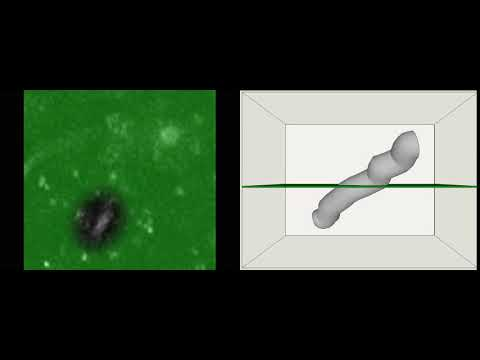

In [17]:
YouTubeVideo('-2aW6m60mYg')

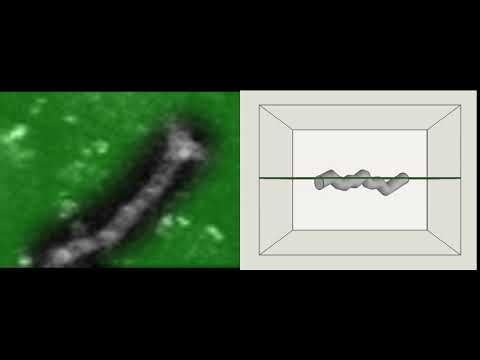

In [18]:
YouTubeVideo('c6TtoQhMrbA')

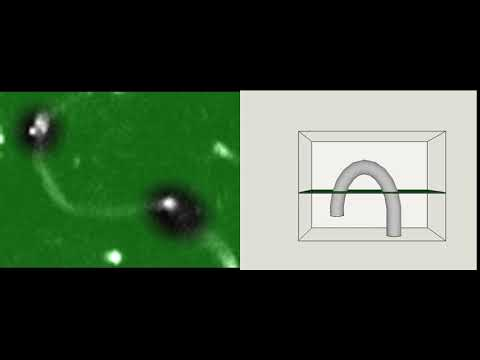

In [19]:
YouTubeVideo('_uJ_dcy-OXQ')

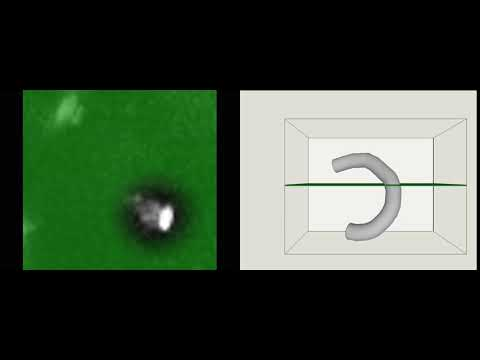

In [20]:
YouTubeVideo('9RFnguYmd_8')

### Stalled and Flowing Clips Pathes

In [21]:
stalled_df = df[df['crowd_score'] >=0.5]
stalled_paths = DATASET_PATH+'/'+folder+'/'+stalled_df['filename'].values
len(stalled_paths), stalled_paths[:5]

(556,
 array(['/home/user/percepto/datasets/ClogLoss/nano/100289.mp4',
        '/home/user/percepto/datasets/ClogLoss/nano/102952.mp4',
        '/home/user/percepto/datasets/ClogLoss/nano/103390.mp4',
        '/home/user/percepto/datasets/ClogLoss/nano/104360.mp4',
        '/home/user/percepto/datasets/ClogLoss/nano/105028.mp4'],
       dtype=object))

In [22]:
flowing_df = df[df['crowd_score'] < 0.5]
flowing_paths = DATASET_PATH+'/'+folder+'/'+flowing_df['filename'].values
len(flowing_paths), flowing_paths[:5]

(857,
 array(['/home/user/percepto/datasets/ClogLoss/nano/100109.mp4',
        '/home/user/percepto/datasets/ClogLoss/nano/100588.mp4',
        '/home/user/percepto/datasets/ClogLoss/nano/100750.mp4',
        '/home/user/percepto/datasets/ClogLoss/nano/102393.mp4',
        '/home/user/percepto/datasets/ClogLoss/nano/102750.mp4'],
       dtype=object))

### Display Flowing Clips

In [23]:
display_clip(flowing_paths[0])

/home/user/percepto/datasets/ClogLoss/nano/100109.mp4


### Display Stalled Clips

In [24]:
display_clip(stalled_paths[0])

/home/user/percepto/datasets/ClogLoss/nano/100289.mp4


### Display Test Clips

In [25]:
display_clip(test_metadata_paths[10])

/home/user/percepto/datasets/ClogLoss/test/100308.mp4


### Read Clip as Tensors

In [26]:
frames = read_clip(stalled_paths[100])
frames.shape

(50, 384, 512, 3)

##### Show some clips frames

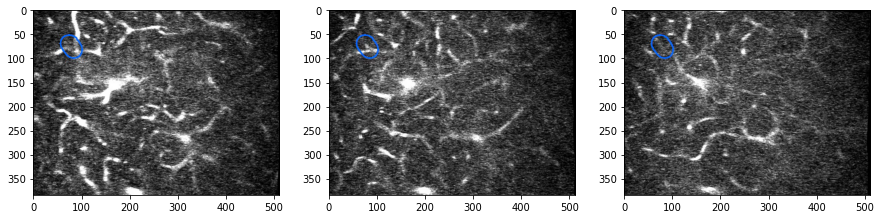

In [27]:
plt.subplot(131)
plt.imshow(frames[0])
plt.subplot(132)
plt.imshow(frames[20])
plt.subplot(133)
plt.imshow(frames[40])

##### Show some mask with frames

In [28]:
masks = extract_masks(frames)

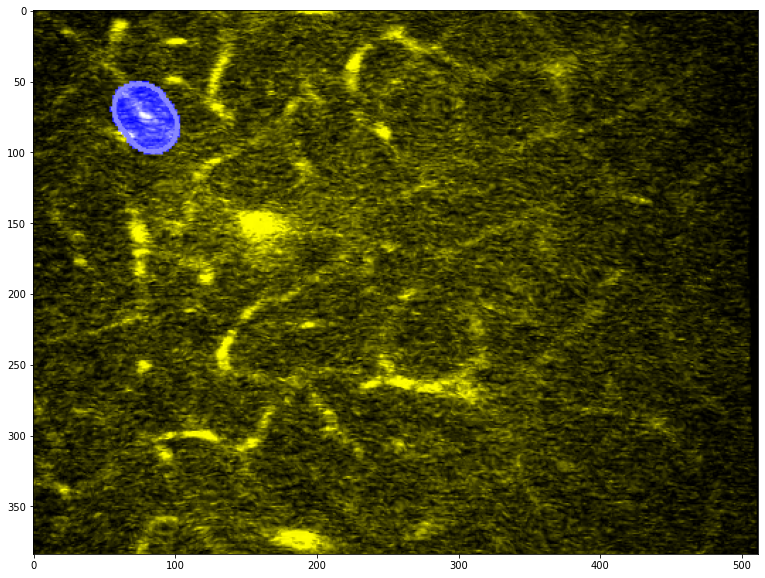

In [29]:
display_fused(frames[30], masks[30])

### DataSet

In [30]:
def read_images(path, y):
    frames = tf.numpy_function(read_clip, [path], tf.uint8)
    masks = tf.numpy_function(extract_masks, [frames], tf.uint8)
    X = frames, masks
    Y = tf.cast(y, tf.float32)
    return X, y

In [31]:
train = tf.data.Dataset.from_tensor_slices((train_paths, train_y)).map(read_images).cache('/tmp/clog_train')
val = tf.data.Dataset.from_tensor_slices((val_paths, val_y)).map(read_images).cache('/tmp/clog_val')

0: frames=(59, 384, 512, 3), masks=(59, 384, 512, 1), label=0


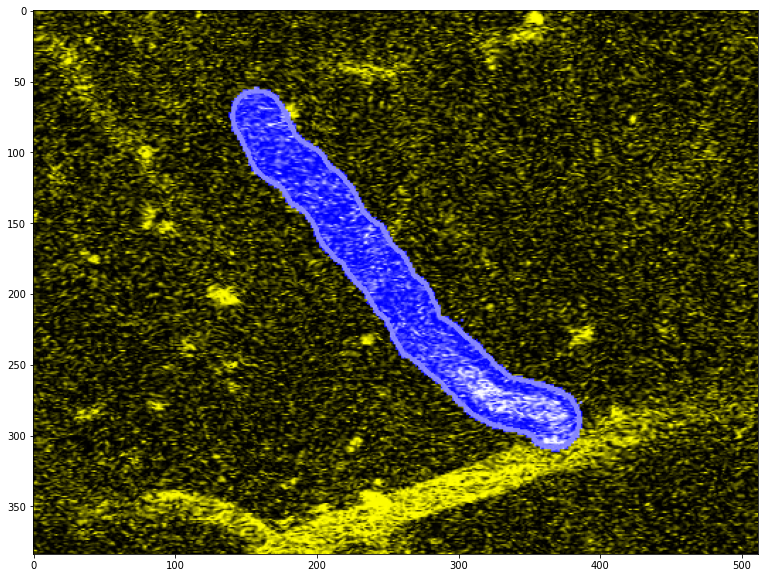

1: frames=(55, 384, 512, 3), masks=(55, 384, 512, 1), label=1


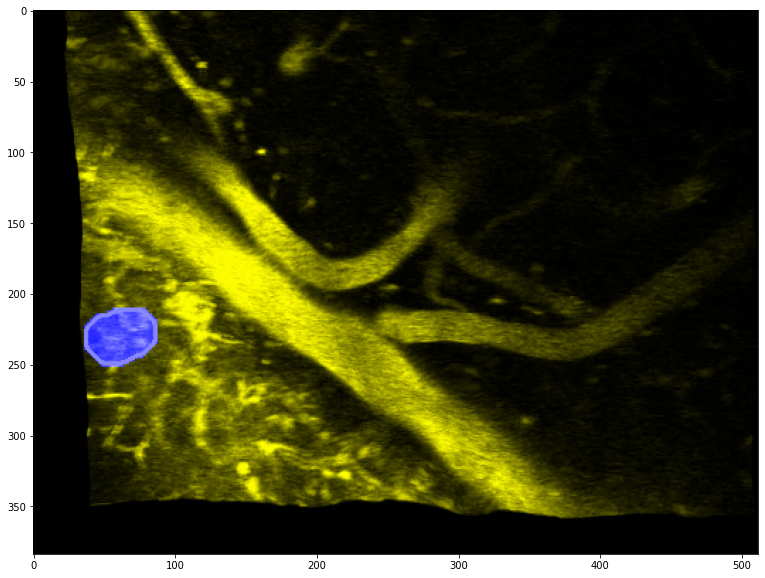

CPU times: user 3.6 s, sys: 166 ms, total: 3.76 s
Wall time: 2.53 s


In [32]:
%%time 
for i, (X, y) in enumerate(val.take(2)):
    frames, masks = X[0], X[1]
    print(f'{i}: frames={frames.shape}, masks={masks.shape}, label={y.numpy()}')
    display_fused(frames[30].numpy(), masks[30].numpy())

In [33]:
train_ds = train.repeat()
#train_ds = train_ds.map(augment, num_parallel_calls=AUTOTUNE, deterministic=False)
train_ds = train_ds.shuffle(100)
train_ds = train_ds.batch(1)
train_ds = train_ds.prefetch(AUTOTUNE)
train_ds

<PrefetchDataset shapes: ((<unknown>, <unknown>), (None,)), types: ((tf.uint8, tf.uint8), tf.int64)>

In [34]:
val_ds = val.repeat()
#val_ds = val_ds.map(augment, num_parallel_calls=AUTOTUNE, deterministic=False)
val_ds = val_ds.batch(1)
val_ds = val_ds.prefetch(AUTOTUNE)
val_ds

<PrefetchDataset shapes: ((<unknown>, <unknown>), (None,)), types: ((tf.uint8, tf.uint8), tf.int64)>

0: frames=(1, 59, 384, 512, 3), masks=(1, 59, 384, 512, 1), label=[0]


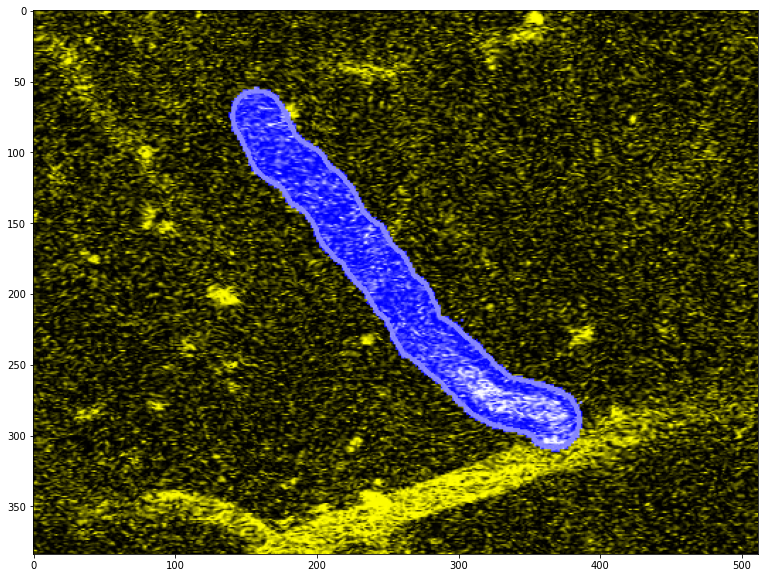

1: frames=(1, 55, 384, 512, 3), masks=(1, 55, 384, 512, 1), label=[1]


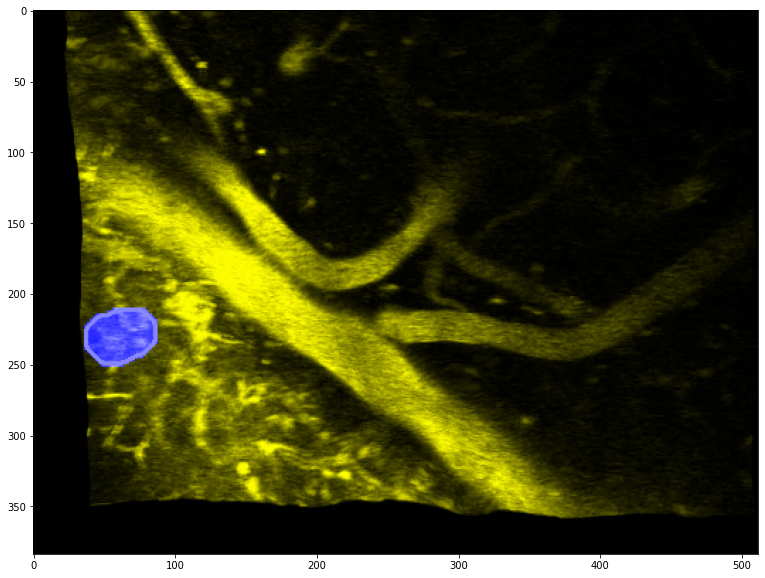

CPU times: user 5.26 s, sys: 176 ms, total: 5.44 s
Wall time: 3.49 s


In [39]:
%%time 
for i, (X, y) in enumerate(val_ds.take(2)):
    frames, masks = X[0], X[1]
    print(f'{i}: frames={frames.shape}, masks={masks.shape}, label={y.numpy()}')
    display_fused(frames[0,30].numpy(), masks[0,30].numpy())

### Model

### Train

### Evaluation

In [36]:
y_true = (val_df['crowd_score'] >= 0.5).astype(int).values
y_true

array([0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1,

In [37]:
y_pred = y_true # should be 1
#y_pred = 1-y_true # should be -1
y_pred = np.random.randint(0, 2, y_true.shape) #  should be around 0
y_pred

array([1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0,
       0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1,
       1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1,

In [38]:
matthews_corrcoef(y_true, y_pred)

0.04439551359924333